<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Import Needed Libraries</h2>
</div>

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.1 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 74.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 82.9 MB/s eta 0:00:00:00:0100:01
  Attempting uninst

In [2]:
import cv2
import os
import PIL
import yaml
import torch
import random
import shutil
import pandas as pd
from sklearn.utils import shuffle
import numpy as np
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import display
import ultralytics
from ultralytics import YOLO
import warnings
warnings.simplefilter('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Reading Dataset And Get Info</h2>
</div>

In [3]:
import shutil

shutil.copytree(
    src='/kaggle/input/mri-for-brain-tumor-with-bounding-boxes',
    dst='/kaggle/working/mri-for-brain-tumor-with-bounding-boxe'
)

'/kaggle/working/mri-for-brain-tumor-with-bounding-boxe'

In [4]:
# Create Director fo Test Images with Labels For Each Labels
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/labels', exist_ok=True)

os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/images', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/labels', exist_ok=True)

os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/labels', exist_ok=True)

os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images', exist_ok=True)
os.makedirs('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/labels', exist_ok=True)

In [5]:
def remove_misMatch_images_train(src_dir):
    
    """
    Remove images from the source directory that do not have corresponding labels.
  
    """
    train_images = os.listdir(f'{src_dir}/images')
    train_labels = os.listdir(f'{src_dir}/labels')

    # Check if all images have corresponding labels
    misMatch_images = []
    for img in train_images:
        imag_base = img.split('.')[0]
        image_name = imag_base + '.txt'
        if image_name not in train_labels:
            misMatch_images.append(imag_base + '.jpg')
    if misMatch_images:
        print(f"Mismatch found in {src_dir}: {misMatch_images}")
        for img in misMatch_images:
            img_path = os.path.join(src_dir, 'images/train', img)
            if os.path.exists(img_path):
                os.remove(img_path)

In [6]:
# Check if the filenames Not match for images and labels for Train
remove_misMatch_images_train('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Glioma')
remove_misMatch_images_train('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Meningioma')
remove_misMatch_images_train('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/No Tumor')
remove_misMatch_images_train('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Pituitary')

In [7]:
def remove_misMatch_images_val(src_dir):
    
    """
    Remove images from the source directory that do not have corresponding labels.
  
    """
    val_images = os.listdir(f'{src_dir}/images')
    val_labels = os.listdir(f'{src_dir}/labels')

    # Check if all images have corresponding labels
    misMatch_images = []
    for img in val_images:
        imag_base = img.split('.')[0]
        image_name = imag_base + '.txt'
        if image_name not in val_labels:
            misMatch_images.append(imag_base + '.jpg')
    if misMatch_images:
        print(f"Mismatch found in {src_dir}: {misMatch_images}")
        for img in misMatch_images:
            img_path = os.path.join(src_dir, 'images', img)
            if os.path.exists(img_path):
                os.remove(img_path)

In [8]:
# Check if the filenames Not match for images and labels for Test
remove_misMatch_images_val('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Glioma')
remove_misMatch_images_val('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Meningioma')
remove_misMatch_images_val('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/No Tumor')
remove_misMatch_images_val('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Pituitary')

Mismatch found in /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/No Tumor: ['image(55).jpg', 'image(61).jpg']


#### Split Train into Train and Test

In [9]:
def Split_Train_Test(src_dir):
    path = f'/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/{src_dir}/images'

    # Move 10% of images to the Test folder
    for i in range(int(len(os.listdir(path)) * 0.1)):
        source_image_path = os.path.join(path, os.listdir(path)[i])
        distenation_image_path = source_image_path.replace('Train', 'Test')
        
        source_label_path = source_image_path.replace('images', 'labels').replace('jpg', 'txt')
        distenation_label_path = distenation_image_path.replace('images', 'labels').replace('jpg', 'txt')
        
        shutil.move(source_image_path, distenation_image_path)
        shutil.move(source_label_path, distenation_label_path)


    print(f"Done Splitting on {src_dir}")

In [10]:
Split_Train_Test('Glioma')
Split_Train_Test('Meningioma')
Split_Train_Test('No Tumor')
Split_Train_Test('Pituitary')

Done Splitting on Glioma
Done Splitting on Meningioma
Done Splitting on No Tumor
Done Splitting on Pituitary


<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">EDA of Images and Get Insights</h2>
</div>

In [11]:
print("Number of images in Glioma train set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Glioma/images')))
print("Number of images in Glioma val set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Glioma/images')))
print("Number of images in Glioma Test set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images')))
print(50*'*')

print("Number of images in Meningioma train set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Meningioma/images')))
print("Number of images in Meningioma val set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Meningioma/images')))
print("Number of images in Meningioma Test set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/images')))
print(50*'*')

print("Number of images in No Tumor train set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/No Tumor/images')))
print("Number of images in No Tumor val set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/No Tumor/images')))
print("Number of images in No Tumor Test set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images')))
print(50*'*')

print("Number of images in Pituitary train set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Pituitary/images')))
print("Number of images in Pituitary val set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Pituitary/images')))
print("Number of images in Pituitary Test set:", len(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images')))
print(50*'*')

Number of images in Glioma train set: 1038
Number of images in Glioma val set: 136
Number of images in Glioma Test set: 115
**************************************************
Number of images in Meningioma train set: 1305
Number of images in Meningioma val set: 140
Number of images in Meningioma Test set: 144
**************************************************
Number of images in No Tumor train set: 640
Number of images in No Tumor val set: 98
Number of images in No Tumor Test set: 71
**************************************************
Number of images in Pituitary train set: 1282
Number of images in Pituitary val set: 136
Number of images in Pituitary Test set: 142
**************************************************


In [12]:
class_Names = ['Glioma','Meningioma','No Tumor','Pituitary']

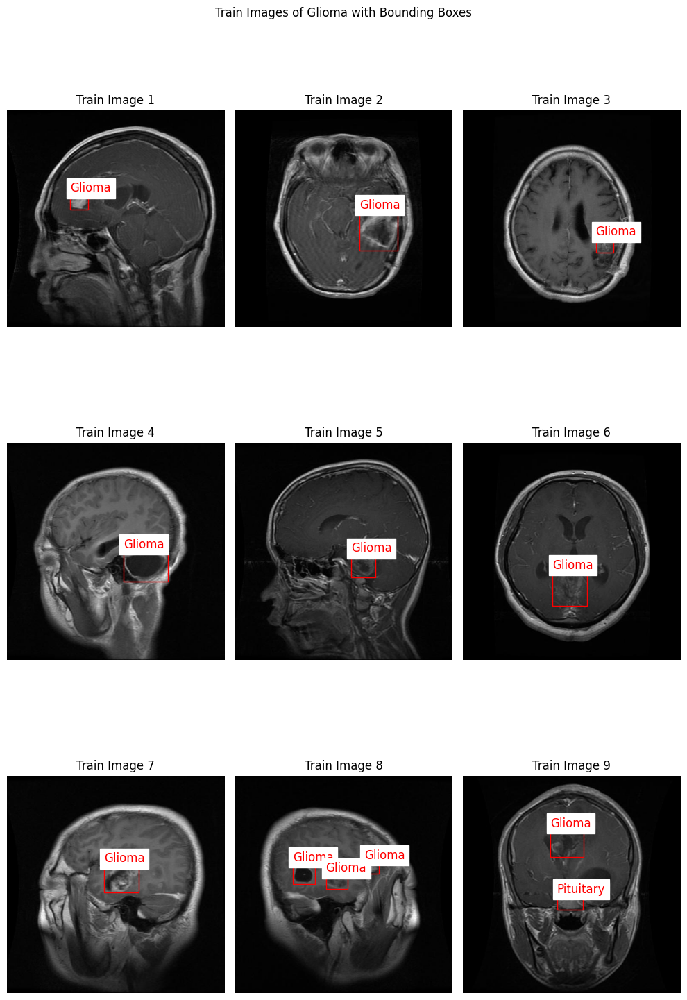

In [13]:
plt.figure(figsize=(10,16))
train_images = os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Glioma/images')
for i in range(9):
    img_path = f'/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Glioma/images/{train_images[i]}'
    img = Image.open(img_path).convert('L')
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(f'Train Image {i + 1}')
    label_file_name = f"/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Glioma/labels/{train_images[i].split('.')[0]}.txt"
    box_bounding = label_file_name
    with open(box_bounding, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, width, height = map(float, line.split())
            x_center *= img.width
            y_center *= img.height
            width *= img.width
            height *= img.height
            x1 = int(x_center - width / 2)
            y1 = int(y_center - height / 2)
            x2 = int(x_center + width / 2)
            y2 = int(y_center + height / 2)
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none'))
            plt.text(x1, y1 - 5,str(class_Names[int(class_id)]),color='red', fontsize=12,backgroundcolor='white')
plt.suptitle('Train Images of Glioma with Bounding Boxes')
plt.tight_layout()
plt.show()

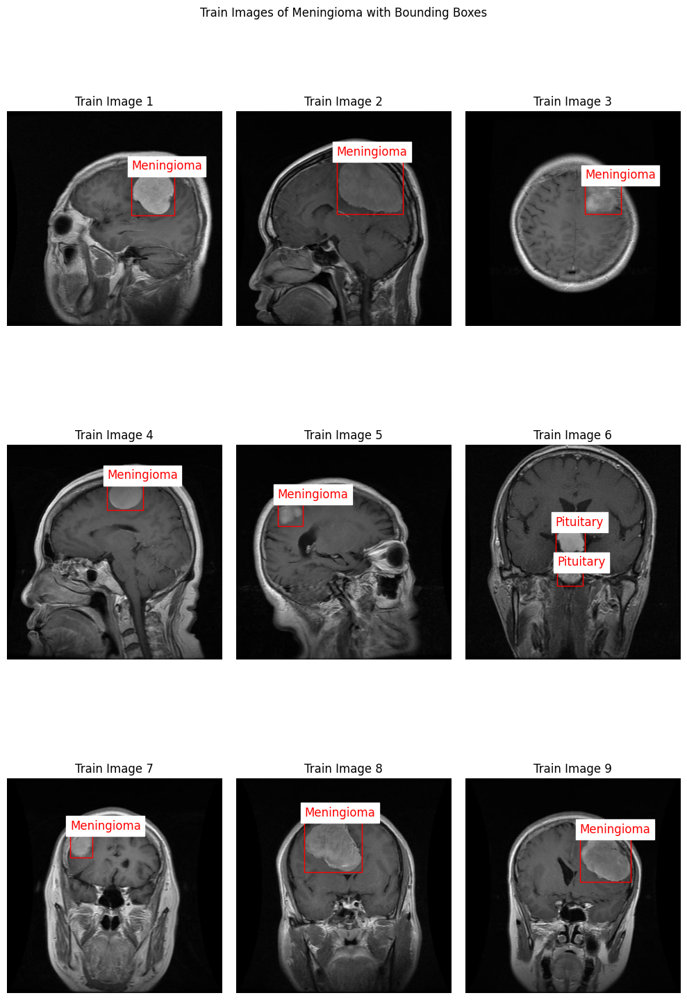

In [14]:
plt.figure(figsize=(10,16))
train_images = os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Meningioma/images')
for i in range(9):
    img_path = f'/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Meningioma/images/{train_images[i]}'
    img = Image.open(img_path).convert('L')
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(f'Train Image {i + 1}')
    label_file_name = f"/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Meningioma/labels/{train_images[i].split('.')[0]}.txt"
    box_bounding = label_file_name
    with open(box_bounding, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, width, height = map(float, line.split())
            x_center *= img.width
            y_center *= img.height
            width *= img.width
            height *= img.height
            x1 = int(x_center - width / 2)
            y1 = int(y_center - height / 2)
            x2 = int(x_center + width / 2)
            y2 = int(y_center + height / 2)
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none'))
            plt.text(x1, y1 - 5,str(class_Names[int(class_id)]),color='red', fontsize=12,backgroundcolor='white')
plt.suptitle('Train Images of Meningioma with Bounding Boxes')
plt.tight_layout()
plt.show()

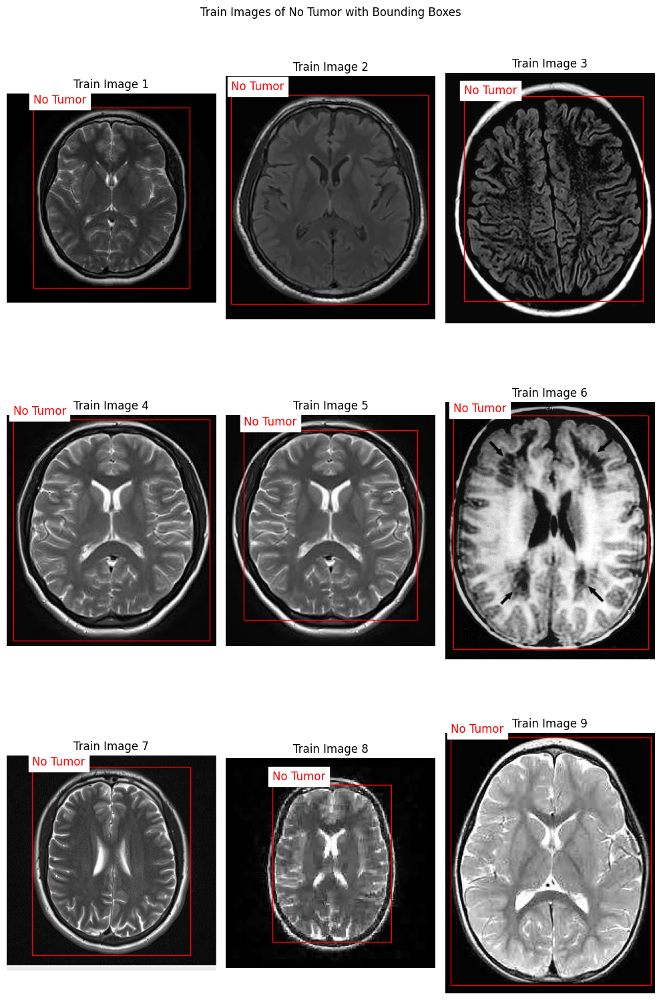

In [15]:
plt.figure(figsize=(10,16))
train_images = os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/No Tumor/images')
for i in range(9):
    img_path = f'/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/No Tumor/images/{train_images[i]}'
    img = Image.open(img_path).convert('L')
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(f'Train Image {i + 1}')
    label_file_name = f"/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/No Tumor/labels/{train_images[i].split('.')[0]}.txt"
    box_bounding = label_file_name
    with open(box_bounding, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, width, height = map(float, line.split())
            x_center *= img.width
            y_center *= img.height
            width *= img.width
            height *= img.height
            x1 = int(x_center - width / 2)
            y1 = int(y_center - height / 2)
            x2 = int(x_center + width / 2)
            y2 = int(y_center + height / 2)
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none'))
            plt.text(x1, y1 - 5,str(class_Names[int(class_id)]),color='red', fontsize=12,backgroundcolor='white')
plt.suptitle('Train Images of No Tumor with Bounding Boxes')
plt.tight_layout()
plt.show()

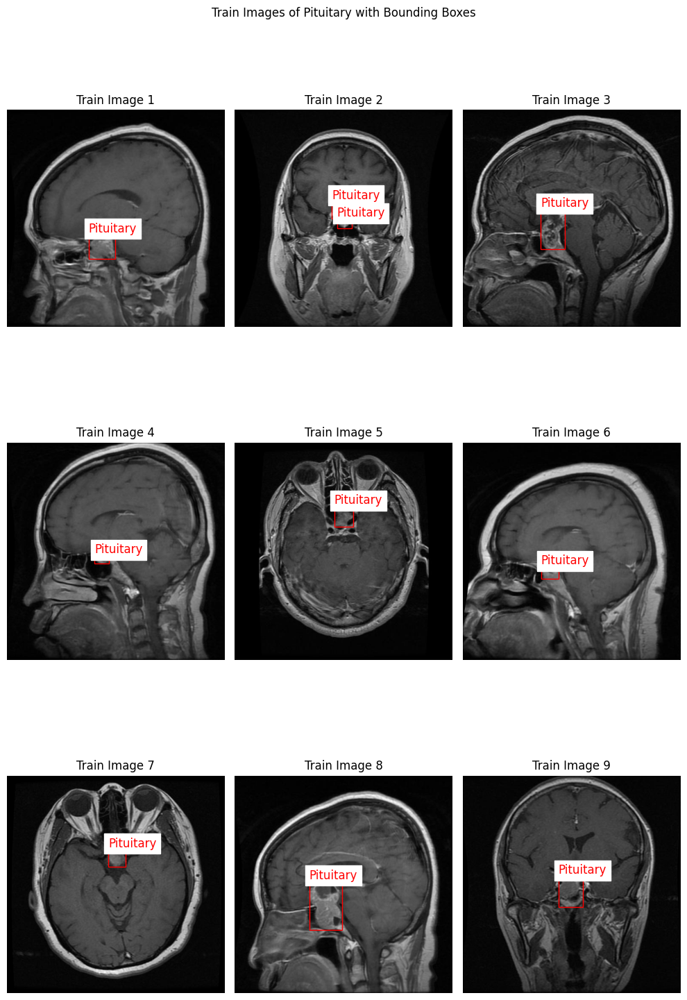

In [16]:
plt.figure(figsize=(10,16))
train_images = os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Pituitary/images')
for i in range(9):
    img_path = f'/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Pituitary/images/{train_images[i]}'
    img = Image.open(img_path).convert('L')
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.title(f'Train Image {i + 1}')
    label_file_name = f"/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Pituitary/labels/{train_images[i].split('.')[0]}.txt"
    box_bounding = label_file_name
    with open(box_bounding, 'r') as f:
        lines = f.readlines()
        for line in lines:
            class_id, x_center, y_center, width, height = map(float, line.split())
            x_center *= img.width
            y_center *= img.height
            width *= img.width
            height *= img.height
            x1 = int(x_center - width / 2)
            y1 = int(y_center - height / 2)
            x2 = int(x_center + width / 2)
            y2 = int(y_center + height / 2)
            plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none'))
            plt.text(x1, y1 - 5,str(class_Names[int(class_id)]),color='red', fontsize=12,backgroundcolor='white')
plt.suptitle('Train Images of Pituitary with Bounding Boxes')
plt.tight_layout()
plt.show()

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Modeling</h2>
</div>

In [17]:
dataset_yaml = {
    'path': '/kaggle/working/mri-for-brain-tumor-with-bounding-boxe',
    'train': '/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train',
    'val': '/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val',
    'test': '/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test',
    'nc': 4,
    'names': ['Glioma','Meningioma','No Tumor','Pituitary']
}

with open('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/dataset.yaml', 'w') as file:
    yaml.dump(dataset_yaml, file)

In [18]:
model = YOLO('yolov8m.pt')

In [19]:
model.train(
    data='/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/dataset.yaml',  
    epochs=50,             
    imgsz=640,             
    batch=16,                       
    name='mri-for-brain-tumor-with-bounding-boxe'
)

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=mri-for-brain-tumor-with-bounding-boxe, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mas

Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 784.8±245.2 MB/s, size: 27.2 KB)


train: Scanning /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Glioma/labels... 4265 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4265/4265 [00:02<00:00, 1544.59it/s]


train: New cache created: /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Train/Glioma/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 470.6±340.8 MB/s, size: 24.8 KB)


val: Scanning /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Glioma/labels... 510 images, 1 backgrounds, 0 corrupt: 100%|██████████| 510/510 [00:00<00:00, 1727.42it/s]


val: New cache created: /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Glioma/labels.cache
Plotting labels to runs/detect/mri-for-brain-tumor-with-bounding-boxe/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/mri-for-brain-tumor-with-bounding-boxe
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       6.1G      1.068      1.787      1.323         14        640: 100%|██████████| 267/267 [02:19<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.09it/s]

                   all        510        554      0.557      0.355      0.355      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.31G      1.125      1.244      1.343         25        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.612      0.561        0.6      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.38G      1.116      1.188      1.349         14        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.29it/s]

                   all        510        554      0.717      0.728      0.792      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.28G      1.064      1.049      1.304         23        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.28it/s]

                   all        510        554      0.774       0.66      0.764      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.35G      1.034     0.9677       1.28         15        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.30it/s]

                   all        510        554      0.812       0.77      0.845      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.41G     0.9998     0.9007      1.266         14        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.883      0.812      0.886      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.29G     0.9565     0.8322      1.234         24        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.888      0.842      0.907       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.36G     0.9418     0.8189       1.23         22        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554       0.83      0.733      0.851      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.49G     0.9481     0.7815      1.219         19        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.877       0.87       0.92      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.26G     0.9346     0.7552      1.225         13        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554       0.89      0.882       0.93      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.34G     0.9019     0.7201      1.202         19        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554      0.908      0.884      0.943      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.35G     0.9006     0.7114      1.198         20        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554      0.918      0.867      0.937      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      6.35G     0.8816     0.6708      1.191         16        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554      0.867      0.902      0.939      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.26G     0.8814     0.6678      1.184         20        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.896      0.888      0.934      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      6.35G     0.8656     0.6508      1.178         12        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.904      0.902      0.937       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      6.37G     0.8634     0.6215      1.172         29        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.916      0.892      0.935      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      6.35G     0.8556     0.6222      1.161         22        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.923      0.918      0.955      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.26G     0.8393     0.6044      1.159         22        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.912      0.922      0.949      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      6.35G     0.8175     0.5753      1.136         20        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.919      0.916      0.943      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.35G     0.8244     0.5931      1.147         15        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.29it/s]

                   all        510        554      0.905      0.916      0.951      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.36G     0.8128     0.5677      1.142          9        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.907      0.929      0.953      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      6.27G     0.8051     0.5487      1.136         22        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.30it/s]

                   all        510        554      0.931      0.909      0.948      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      6.34G      0.803     0.5469      1.136         19        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.933      0.918      0.956      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      6.35G     0.7909     0.5322      1.126         19        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554      0.921      0.944      0.957      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      6.35G     0.7877     0.5238      1.122         24        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.30it/s]

                   all        510        554      0.918      0.932      0.952      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      6.26G     0.7837     0.5256      1.124         17        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.923      0.933      0.954      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.35G     0.7647     0.5139       1.11         12        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.957      0.901      0.957      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.36G     0.7629     0.4987      1.109         21        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.951      0.916      0.954      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.35G     0.7546     0.4942      1.105         25        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.29it/s]

                   all        510        554      0.947      0.909       0.96      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.26G     0.7492     0.4804      1.102         11        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554       0.95      0.921      0.954       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.34G     0.7477     0.4673      1.103         11        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554      0.948      0.933      0.961      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.36G     0.7339     0.4715      1.093         11        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.951      0.938      0.962      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.36G     0.7343      0.456      1.099         15        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.939      0.924      0.958      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      6.26G     0.7185     0.4525      1.082         16        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.961      0.918      0.959      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.35G     0.7248     0.4427      1.087         16        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.944      0.925      0.966      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.34G     0.7048     0.4348      1.076         15        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554      0.955      0.914      0.963      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.36G     0.7118     0.4293      1.079         25        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554      0.956      0.943      0.966      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.26G     0.6977     0.4292      1.069         19        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.957      0.935      0.963      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.35G     0.6823     0.4152      1.065         19        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.961      0.936      0.968      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.35G     0.6954     0.4122      1.072         19        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.36it/s]

                   all        510        554      0.955      0.939      0.963      0.786


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.35G     0.6407     0.3559      1.037         12        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.945      0.933      0.961      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.27G     0.6269     0.3405      1.027         10        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.959       0.93      0.968      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.35G     0.6104     0.3307      1.025         11        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        510        554       0.96      0.926      0.968      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.35G     0.6121     0.3293      1.021          9        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.951      0.941      0.965      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.36G     0.5998     0.3173      1.009         11        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554      0.954      0.939      0.967        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.26G     0.5897      0.306      1.002          9        640: 100%|██████████| 267/267 [02:20<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.34it/s]

                   all        510        554      0.958      0.936      0.968      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.34G     0.5815     0.3017     0.9991         16        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554      0.951      0.947      0.967      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.35G     0.5736     0.2994     0.9949          9        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.32it/s]

                   all        510        554       0.95      0.948       0.97      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.35G     0.5656     0.2896     0.9889         11        640: 100%|██████████| 267/267 [02:20<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.35it/s]

                   all        510        554       0.95      0.952       0.97      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.26G      0.561     0.2877     0.9888         11        640: 100%|██████████| 267/267 [02:19<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.31it/s]

                   all        510        554       0.96      0.943      0.969      0.807



50 epochs completed in 2.058 hours.
Optimizer stripped from runs/detect/mri-for-brain-tumor-with-bounding-boxe/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/mri-for-brain-tumor-with-bounding-boxe/weights/best.pt, 52.0MB

Validating runs/detect/mri-for-brain-tumor-with-bounding-boxe/weights/best.pt...
Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.16it/s]


                   all        510        554       0.96      0.943      0.969      0.807
                Glioma        135        153      0.945      0.892      0.936      0.769
            Meningioma        140        142      0.981      0.993      0.993      0.848
              No Tumor         98         98          1      0.995      0.995      0.851
             Pituitary        154        161      0.915      0.894      0.953      0.759
Speed: 0.2ms preprocess, 10.5ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/mri-for-brain-tumor-with-bounding-boxe


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b92c8180a10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [20]:
# Evaluate the trained model on Validate Images
best_model = YOLO('/kaggle/working/runs/detect/mri-for-brain-tumor-with-bounding-boxe/weights/best.pt')
metrics = best_model.val(
    data="/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/dataset.yaml",
    split="val",
    plots=True
)

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 584.4±242.8 MB/s, size: 17.9 KB)


val: Scanning /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Val/Glioma/labels.cache... 510 images, 1 backgrounds, 0 corrupt: 100%|██████████| 510/510 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:14<00:00,  2.25it/s]


                   all        510        554       0.96      0.943      0.969      0.809
                Glioma        135        153      0.945      0.892      0.935      0.767
            Meningioma        140        142      0.981      0.993      0.993      0.849
              No Tumor         98         98          1      0.995      0.995      0.857
             Pituitary        154        161      0.915      0.894      0.953      0.762
Speed: 0.9ms preprocess, 23.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val


In [21]:
# Evaluate the trained model on Test Images
metrics = best_model.val(
    data="/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/dataset.yaml",
    split="test",
    plots=True
)

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 706.4±247.5 MB/s, size: 28.0 KB)


val: Scanning /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/labels... 472 images, 0 backgrounds, 0 corrupt: 100%|██████████| 472/472 [00:00<00:00, 1178.05it/s]


val: New cache created: /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:13<00:00,  2.22it/s]


                   all        472        537      0.937      0.919      0.962        0.8
                Glioma        113        133      0.894      0.895      0.933      0.733
            Meningioma        144        145      0.975      0.993      0.995      0.865
              No Tumor         71         71      0.986      0.963      0.991      0.881
             Pituitary        173        188      0.894      0.824       0.93      0.721
Speed: 0.8ms preprocess, 24.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val2


<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Evaluate the Model on Validation Images</h2>
</div>

#### Validate Batch 0 

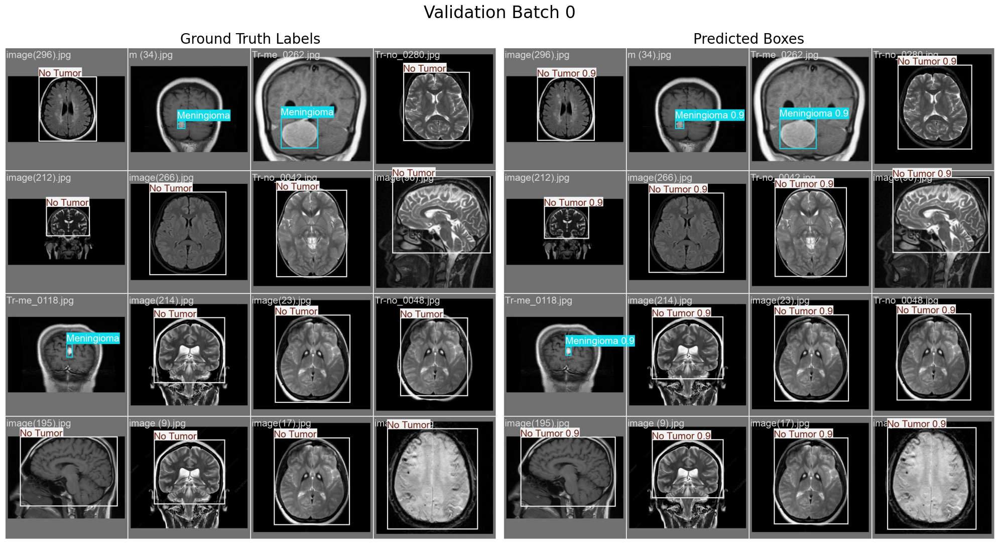

In [22]:
import matplotlib.image as mpimg
img1 = mpimg.imread('/kaggle/working/runs/detect/mri-for-brain-tumor-with-bounding-boxe/val_batch0_labels.jpg')
img2 = mpimg.imread('/kaggle/working/runs/detect/mri-for-brain-tumor-with-bounding-boxe/val_batch0_pred.jpg')

plt.figure(figsize=(20, 12))

plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title('Ground Truth Labels', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title('Predicted Boxes', fontsize=20)
plt.axis('off')

plt.suptitle('Validation Batch 0', fontsize=24)

plt.tight_layout()
plt.subplots_adjust(top=0.99)
plt.show()

#### Validate Batch 1

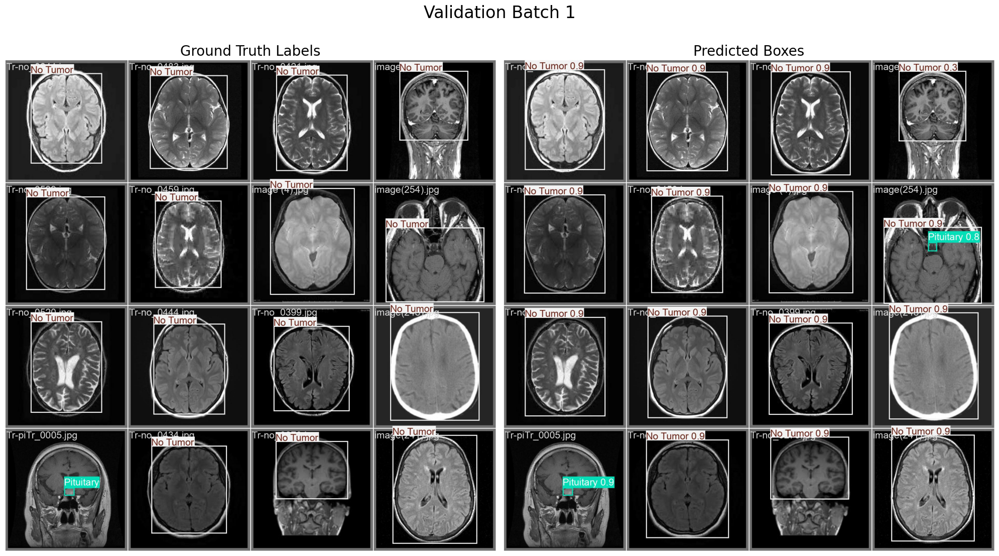

In [23]:
img1 = mpimg.imread('/kaggle/working/runs/detect/mri-for-brain-tumor-with-bounding-boxe/val_batch1_labels.jpg')
img2 = mpimg.imread('/kaggle/working/runs/detect/mri-for-brain-tumor-with-bounding-boxe/val_batch1_pred.jpg')

plt.figure(figsize=(20, 12))

plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title('Ground Truth Labels', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title('Predicted Boxes', fontsize=20)
plt.axis('off')

plt.suptitle('Validation Batch 1', fontsize=24)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

#### Validate Batch 2

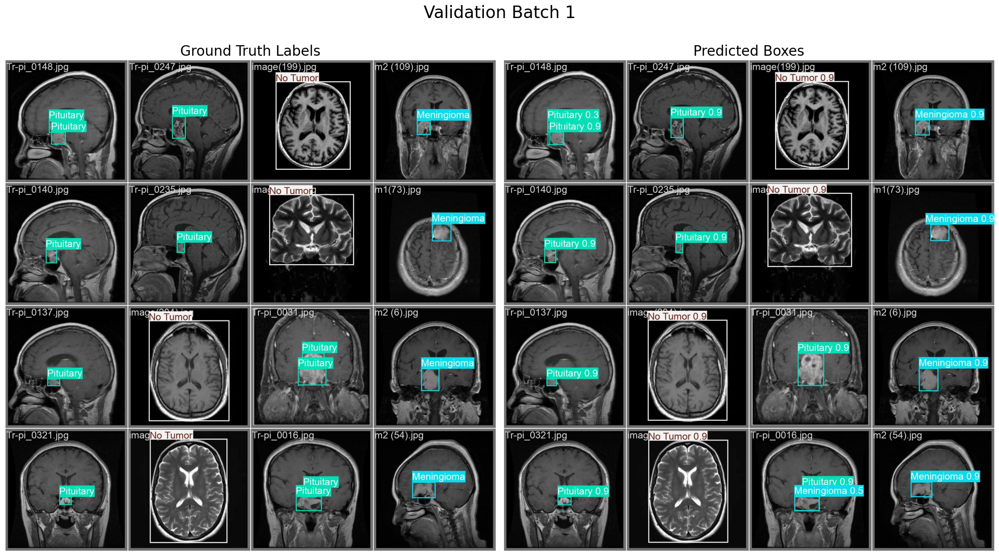

In [24]:
img1 = mpimg.imread('/kaggle/working/runs/detect/mri-for-brain-tumor-with-bounding-boxe/val_batch2_labels.jpg')
img2 = mpimg.imread('/kaggle/working/runs/detect/mri-for-brain-tumor-with-bounding-boxe/val_batch2_pred.jpg')

plt.figure(figsize=(20, 12))

plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title('Ground Truth Labels', fontsize=20)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title('Predicted Boxes', fontsize=20)
plt.axis('off')

plt.suptitle('Validation Batch 1', fontsize=24)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

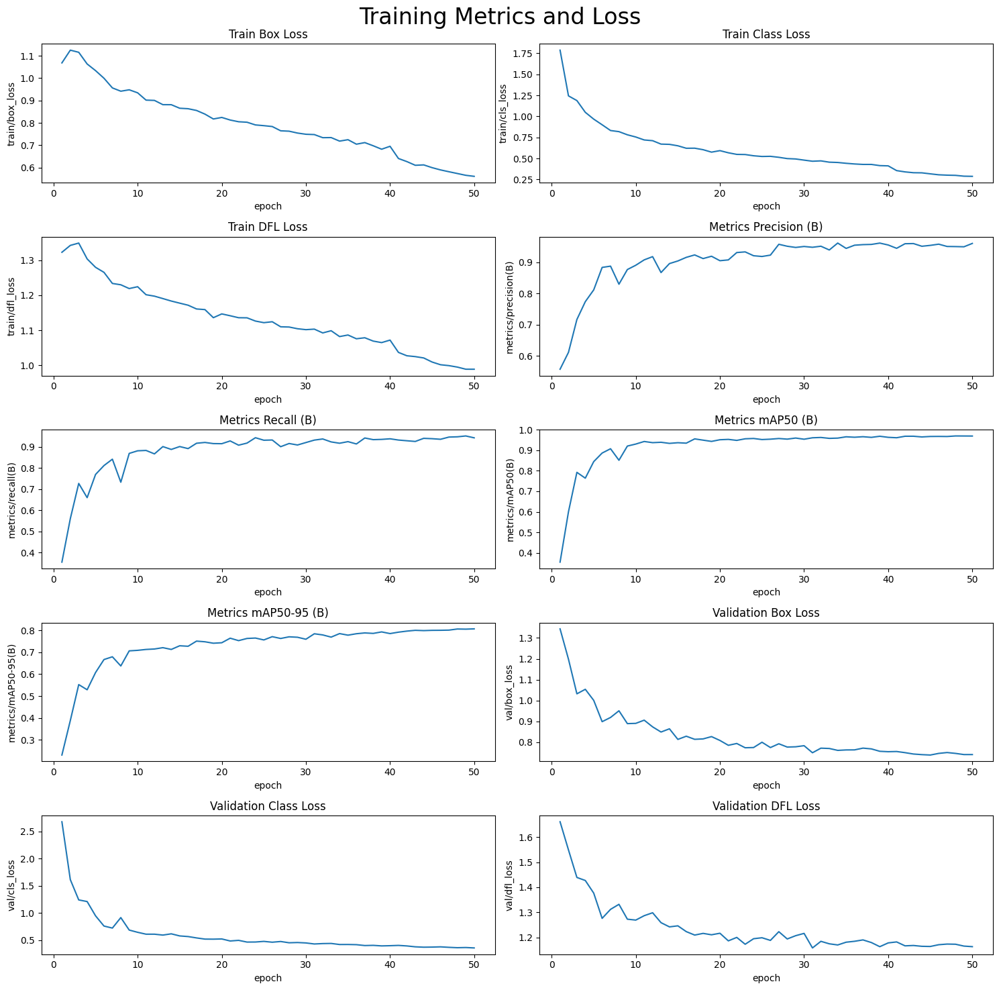

In [25]:
%matplotlib inline
import seaborn as sns
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/mri-for-brain-tumor-with-bounding-boxe/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

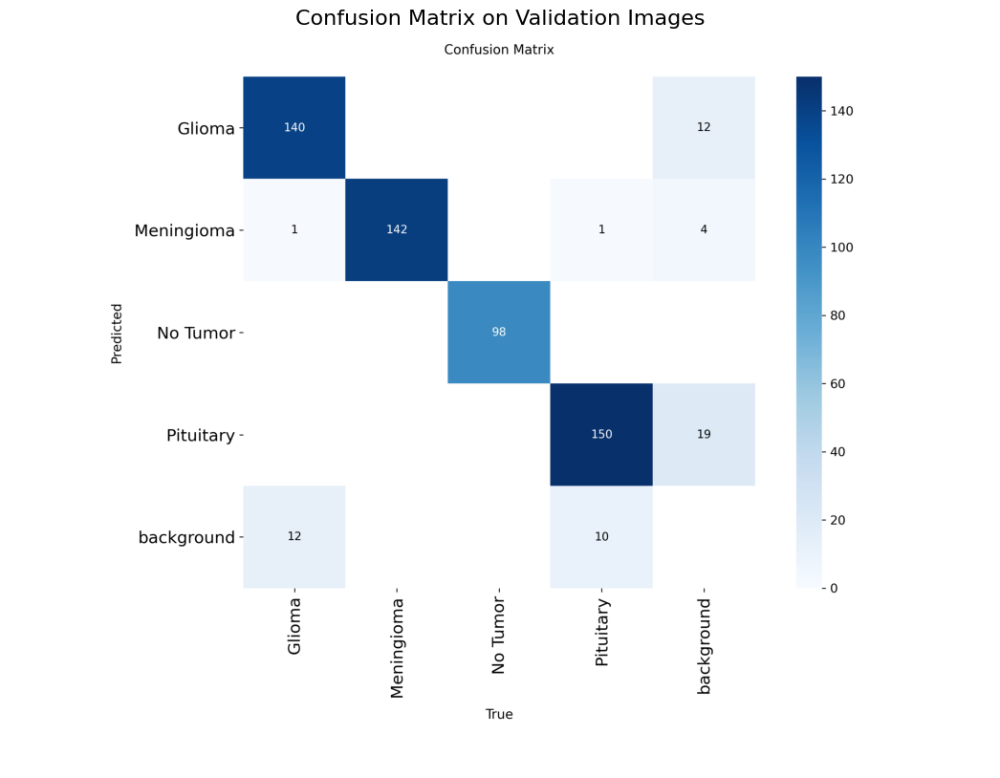

In [27]:
img = mpimg.imread('/kaggle/working/runs/detect/val/confusion_matrix.png')

plt.figure(figsize=(16, 10)) 
plt.imshow(img)
plt.axis('off')  
plt.title("Confusion Matrix on Validation Images", fontsize=16)
plt.show()

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Evaluate the Model on Test Images</h2>
</div>

#### Confusion Matrix on Test Images

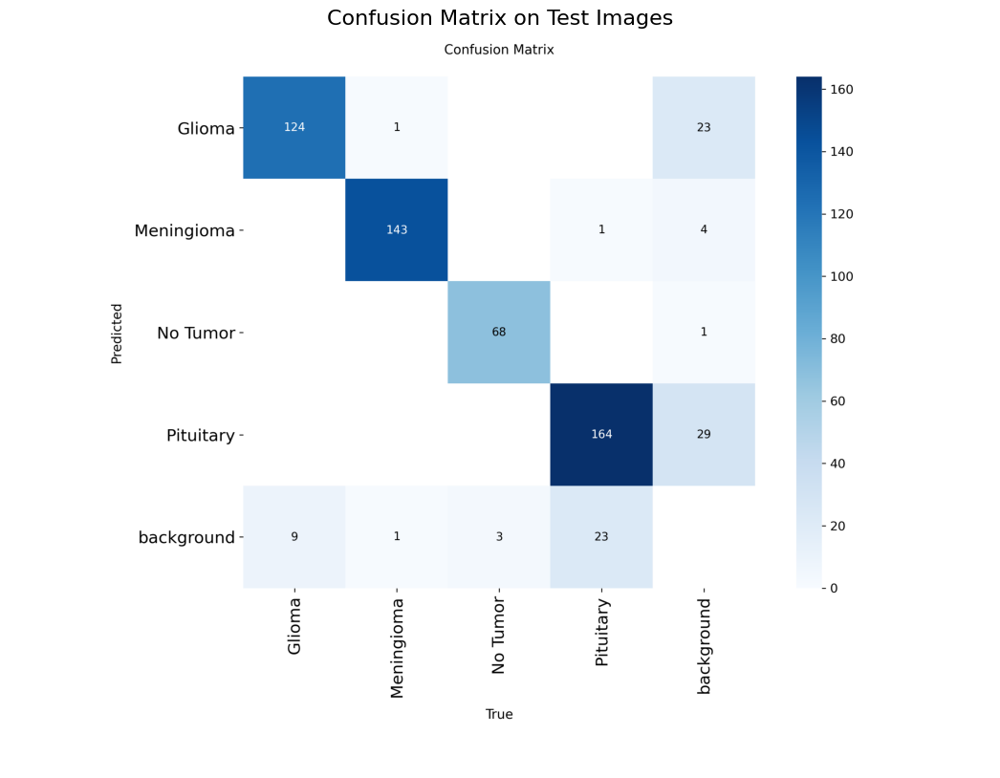

In [28]:
img = mpimg.imread('/kaggle/working/runs/detect/val2/confusion_matrix.png')

plt.figure(figsize=(16, 10)) 
plt.imshow(img)
plt.axis('off')  
plt.title("Confusion Matrix on Test Images", fontsize=16)
plt.show()

#### Predict on Random Test Images

In [29]:
def ODImage(src_dir, image):
    img_path = os.path.join(src_dir, image)
    
    yolo_outputs = model.predict(img_path)
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # ---- Load Ground Truth ----
    gt_boxes = []
    label_file = image.rsplit('.', 1)[0] + '.txt'
    label_path = os.path.join(src_dir.replace('images', 'labels'), label_file)

    if os.path.exists(label_path):
        h, w, _ = img.shape
        with open(label_path, 'r') as f:
            for line in f:
                cls, xc, yc, bw, bh = map(float, line.strip().split())
                label_true = names[int(cls)]
                x1 = int((xc - bw / 2) * w)
                y1 = int((yc - bh / 2) * h)
                x2 = int((xc + bw / 2) * w)
                y2 = int((yc + bh / 2) * h)
                gt_boxes.append((x1, y1, x2, y2, label_true))

    # ---- Predictions ----
    for j in range(len(box)):
        label_pred = names[box.cls[j].item()]
        x1, y1, x2, y2 = map(int, box.xyxy[j].tolist())
        conf = np.round(box.conf[j].item(), 2)
        pred_text = f"Pred: {label_pred} ({conf})"

        # Prediction label above
        cv2.putText(img_rgb, pred_text, (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # ---- Ground Truth ----
    for (x1, y1, x2, y2, label_true) in gt_boxes:
        true_text = f"True: {label_true}"
        cv2.putText(img_rgb, true_text, (x1, y2 + 20),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)

    return img_rgb



image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images/gg (235).jpg: 640x640 1 Glioma, 36.3ms
Speed: 3.9ms preprocess, 36.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images/gg (43).jpg: 640x640 1 Glioma, 36.3ms
Speed: 2.7ms preprocess, 36.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images/Tr-gl_1096.jpg: 640x640 1 Glioma, 36.2ms
Speed: 2.3ms preprocess, 36.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images/gg (485).jpg: 640x640 1 Glioma, 36.2ms
Speed: 2.8ms preprocess, 36.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images/Te-gl_0143.jpg: 640x640 2 Glio

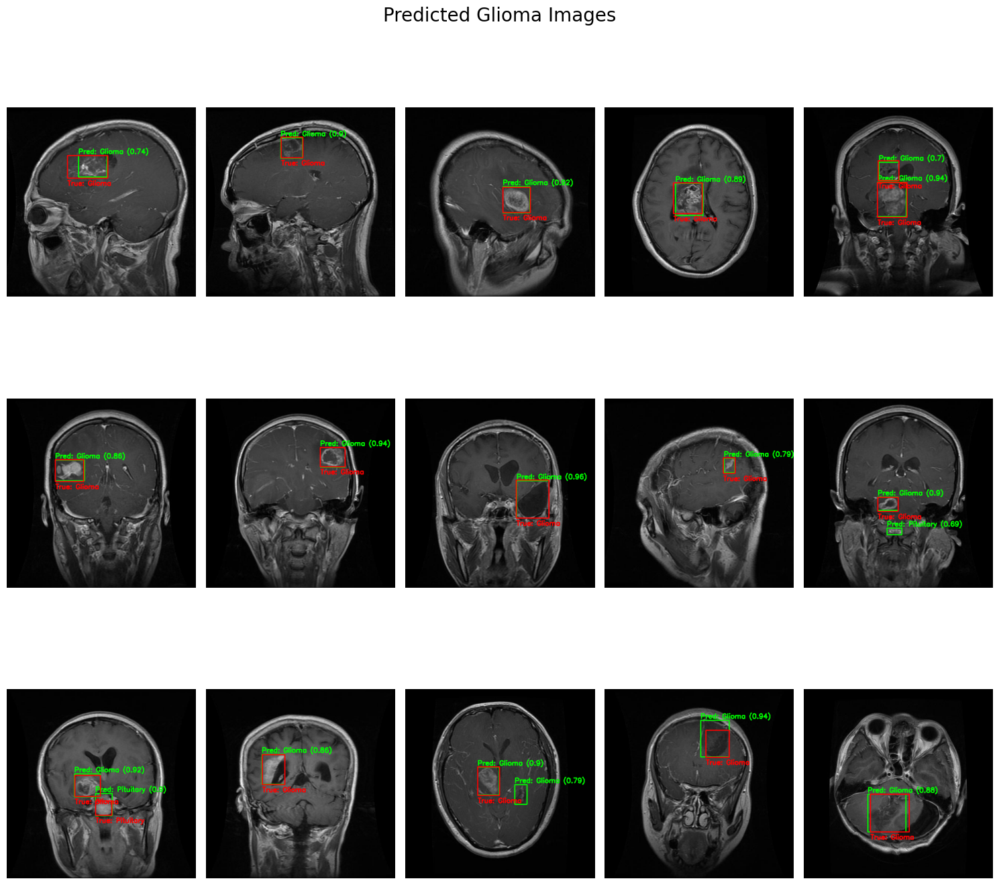

In [30]:
img_paths = list(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images'))
img_paths = shuffle(img_paths)


plt.figure(figsize=(15, 16))

plt.suptitle('Predicted Glioma Images', fontsize=20,y=0.92)
for i in range(15):
    img_vis = ODImage('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Glioma/images', img_paths[i])
    plt.subplot(3, 5, i+1)
    plt.imshow(img_vis)
    plt.axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()


image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/images/Tr-me_0556.jpg: 640x640 1 Meningioma, 20.1ms
Speed: 3.5ms preprocess, 20.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/images/m3 (79).jpg: 640x640 1 Meningioma, 1 Pituitary, 20.0ms
Speed: 2.6ms preprocess, 20.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/images/m2 (76).jpg: 640x640 1 Meningioma, 20.7ms
Speed: 2.3ms preprocess, 20.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/images/m3 (36).jpg: 640x640 1 Meningioma, 20.4ms
Speed: 2.9ms preprocess, 20.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/M

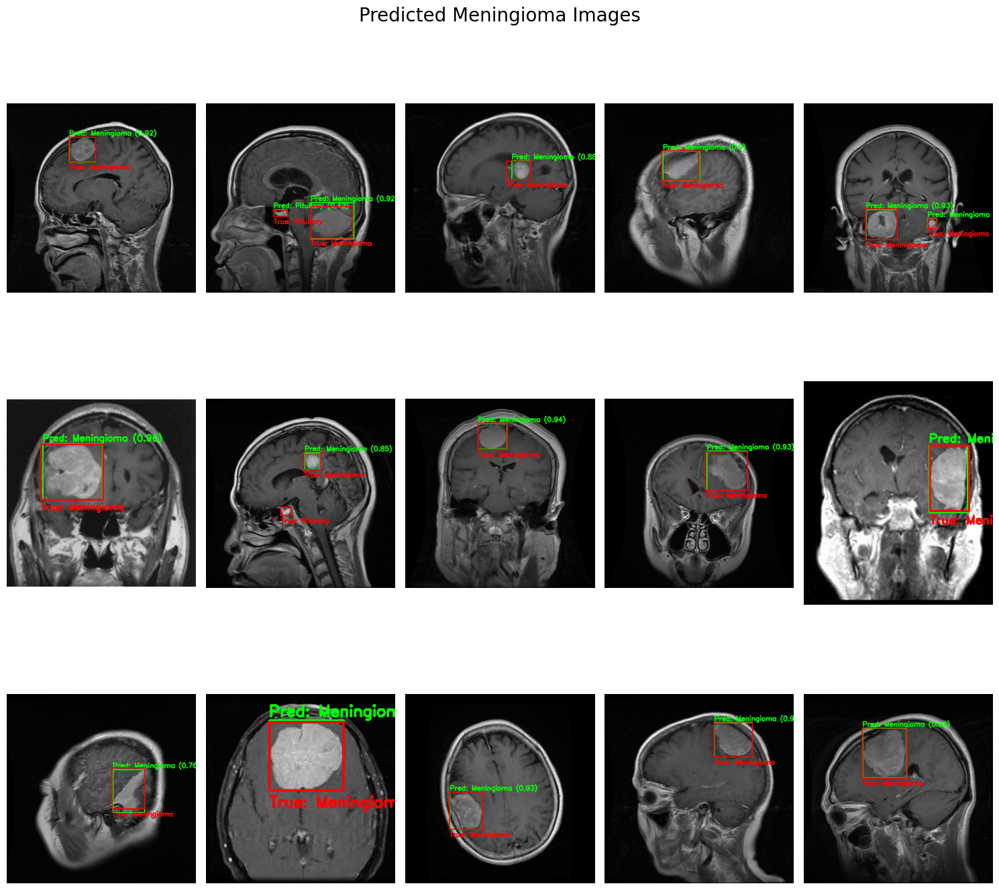

In [31]:
img_paths = list(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/images'))
img_paths = shuffle(img_paths)

plt.figure(figsize=(15, 16))

plt.suptitle('Predicted Meningioma Images', fontsize=20,y=0.92)
for i in range(15):
    img_vis = ODImage('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Meningioma/images', img_paths[i])
    plt.subplot(3, 5, i+1)
    plt.imshow(img_vis)
    plt.axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()


image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images/Tr-no_1102.jpg: 640x544 1 No Tumor, 17.8ms
Speed: 3.0ms preprocess, 17.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 544)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images/Tr-no_0276.jpg: 640x640 1 No Tumor, 18.6ms
Speed: 2.5ms preprocess, 18.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images/image(223).jpg: 640x640 1 No Tumor, 19.0ms
Speed: 2.7ms preprocess, 19.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images/Tr-no_0850.jpg: 640x640 1 No Tumor, 18.8ms
Speed: 3.9ms preprocess, 18.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images/Tr-no

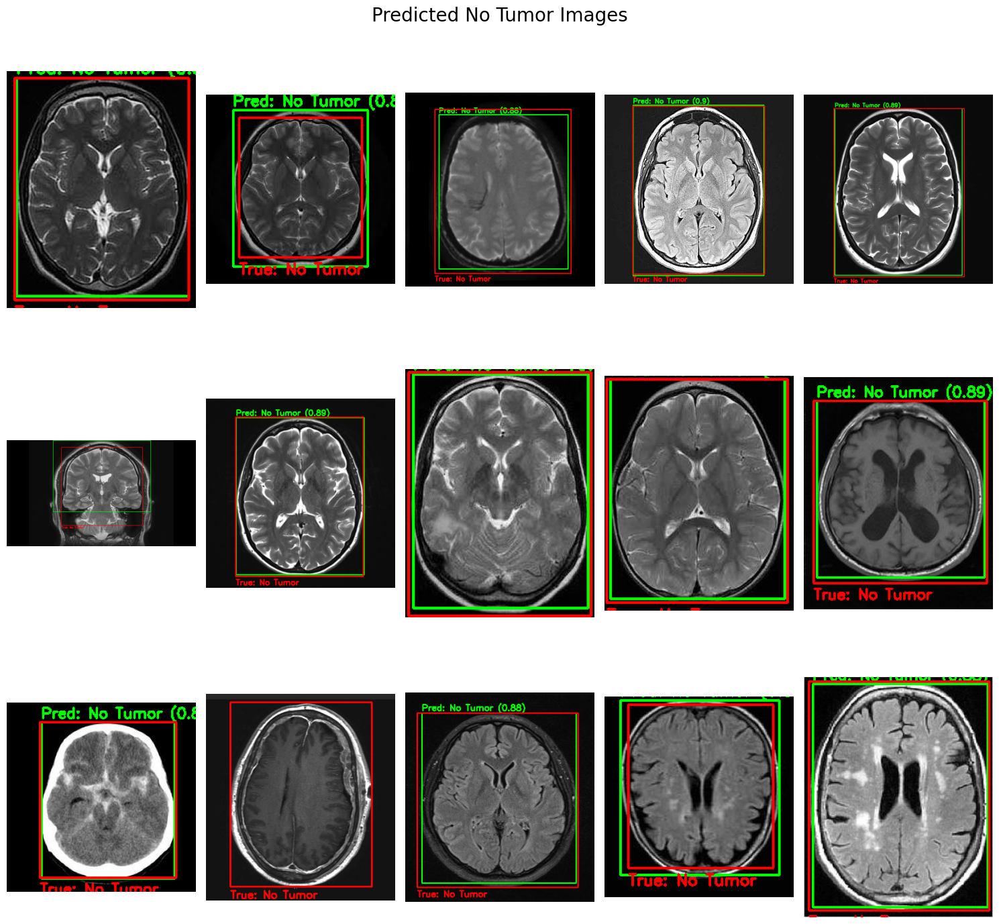

In [32]:
img_paths = list(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images'))
img_paths = shuffle(img_paths)

plt.figure(figsize=(15, 16))

plt.suptitle('Predicted No Tumor Images', fontsize=20,y=0.92)
for i in range(15):
    img_vis = ODImage('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/No Tumor/images', img_paths[i])
    plt.subplot(3, 5, i+1)
    plt.imshow(img_vis)
    plt.axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()


image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images/Tr-pi_0164.jpg: 640x640 1 Pituitary, 28.6ms
Speed: 2.8ms preprocess, 28.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images/p (279).jpg: 640x640 1 Pituitary, 28.6ms
Speed: 5.1ms preprocess, 28.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images/Tr-pi_1354.jpg: 640x640 1 Pituitary, 28.6ms
Speed: 4.6ms preprocess, 28.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images/Tr-pi_0918.jpg: 640x640 1 Pituitary, 28.2ms
Speed: 4.4ms preprocess, 28.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images

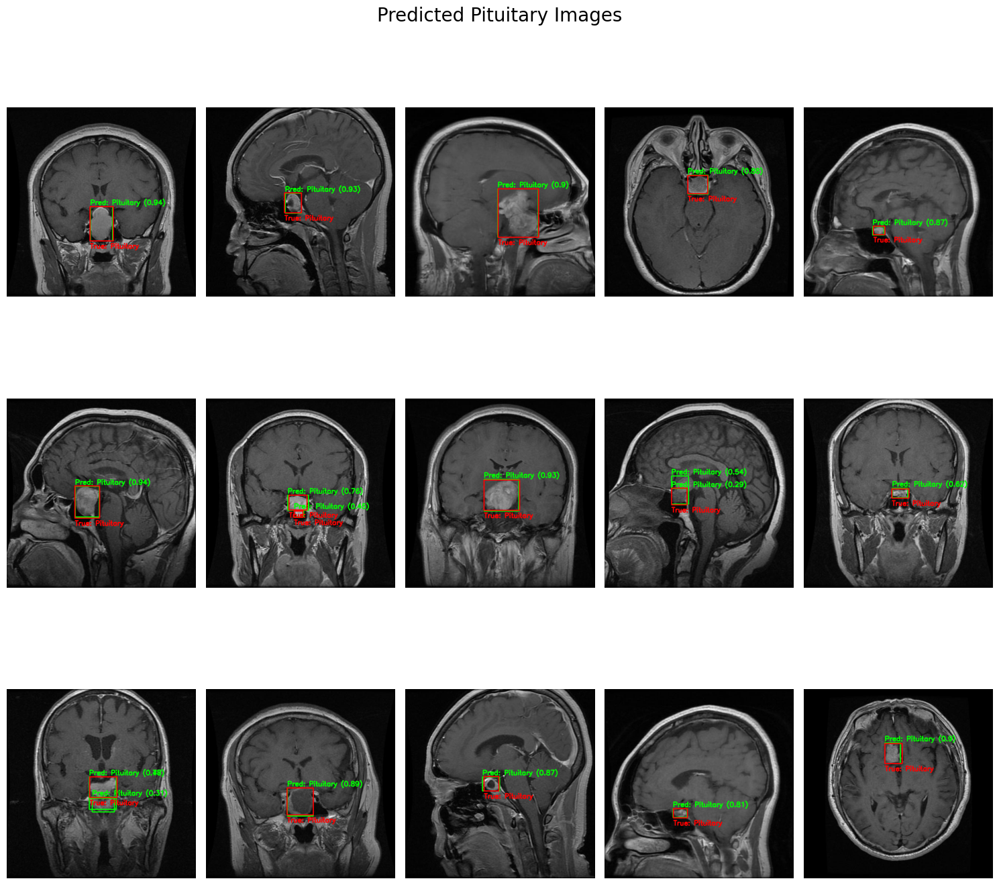

In [33]:
img_paths = list(os.listdir('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images'))
img_paths = shuffle(img_paths)

plt.figure(figsize=(15, 16))

plt.suptitle('Predicted Pituitary Images', fontsize=20,y=0.92)
for i in range(15):
    img_vis = ODImage('/kaggle/working/mri-for-brain-tumor-with-bounding-boxe/Test/Pituitary/images', img_paths[i])
    plt.subplot(3, 5, i+1)
    plt.imshow(img_vis)
    plt.axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()